In [1]:
import os
import json
import math
import numpy as np 
import pandas as pd

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.reset_orig()
sns.set()


## PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
# Torchvision
import torchvision
from torchvision.datasets import FashionMNIST
from torchvision import transforms

/var/folders/_8/8qs28kr50_v5rng3_4jhcdfr0000gn/T/ipykernel_34464/309872129.py:11: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export


In [2]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print("Device:", device)

Device: cpu


## Przygotowanie danych

In [3]:
# Transformations applied on each image => only make them a tensor
transform = transforms.Compose([transforms.ToTensor()])

# Loading the training dataset. We need to split it into a training and validation part
train_dataset = FashionMNIST(root="data/", train=True, transform=transform, download=True)

# Loading the test set
test_set = FashionMNIST(root="data/", train=False, transform=transform, download=True)

# We define a set of data loaders that we can use for various purposes later.
train_loader = data.DataLoader(train_dataset, batch_size=256, shuffle=True, drop_last=True, pin_memory=True, num_workers=4)
test_loader = data.DataLoader(test_set, batch_size=256, shuffle=False, drop_last=False, num_workers=4)

def get_train_images(num):
    return torch.stack([test_set[i][0] for i in range(10,10+num)], dim=0)

0.2%

100.0%


Extracting data/FashionMNIST/raw/train-images-idx3-ubyte.gz to data/FashionMNIST/raw



100.0%


Extracting data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to data/FashionMNIST/raw



100.0%


Extracting data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to data/FashionMNIST/raw



100.0%

Extracting data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to data/FashionMNIST/raw



# Budowanie autoenkodera wariacyjnego 
VAE tak samo jak zwykły autoenkoder zbudowany jest z enkodera który mapuje wejściowe obrazki **x** w niskowymiarową przestrzeń ukrytą **z**, oraz dekodera który odwraca tę operację i rekonstruuje wejście **x** z przestrzeni ukrytej **z**

Zacznijmy od stworzenia enkodera

In [4]:
class Encoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(Encoder, self).__init__()

        self.fc_1 = nn.Linear(input_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_mean  = nn.Linear(hidden_dim, latent_dim)
        self.fc_var   = nn.Linear (hidden_dim, latent_dim)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
        self.training = True
        
    def forward(self, x):
        x = torch.flatten(x, 1)
        x       = self.LeakyReLU(self.fc_1(x))
        x       = self.LeakyReLU(self.fc_2(x))
        mean     = self.fc_mean(x)
        log_var  = self.fc_var(x)                      # encoder produces mean and log of variance 
                                                       #             (i.e., parateters of simple tractable normal distribution "q"
        
        return mean, log_var

In [5]:
class Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super(Decoder, self).__init__()
        self.fc_1 = nn.Linear(latent_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_3 = nn.Linear(hidden_dim, output_dim)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
    def forward(self, x):
        h     = self.LeakyReLU(self.fc_1(x))
        h     = self.LeakyReLU(self.fc_2(h))
        
        x_hat = torch.sigmoid(self.fc_3(h))
        x_hat = x_hat.view([-1, 1, 28, 28])
        return x_hat
        

### Uzupełnij metodę losowania nowych przykładów w przestrzeni ukrytej

# ZMIENIC PRZED WYSŁANIEM!!!!!!!!!!!!!!!!!!!!!!!!

In [6]:
class VAE(nn.Module):
    def __init__(self, x_dim, hidden_dim, latent_dim):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = Encoder(input_dim=x_dim, hidden_dim=hidden_dim, latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim, hidden_dim = hidden_dim, output_dim = x_dim)

        
    def reparameterization(self, mean, var):
        epsilon = torch.randn_like(var).to(device)        # sampling epsilon        
        z = mean + var * epsilon                          # reparameterization trick
#         z = mean # Change to proper sampling
        return z
        
                
    def forward(self, x):
        mean, log_var = self.encoder(x)
        z = self.reparameterization(mean, torch.exp(0.5 * log_var)) # takes exponential function (log var -> var)
        x_hat = self.decoder(z)
        return x_hat, mean, log_var

In [7]:
vae = VAE(latent_dim=32, hidden_dim=256, x_dim=784).to(device)

# Możemy zacząć trening

In [8]:
criterion = nn.MSELoss(reduction="sum")
optimizer = optim.Adam(vae.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=0.99)

In [9]:
num_epochs = 30
for n in range(num_epochs):
    losses_epoch = []
    for x, _ in iter(train_loader):
        x = x.to(device)
        out, means, log_var = vae(x)
        loss = criterion(out, x) 
        losses_epoch.append(loss.item())
        loss.backward()               # backward pass (compute parameter updates)
        optimizer.step()              # make the updates for each parameter
        optimizer.zero_grad()  
    L1_list = []
#     if n % 10 == 0:
    for x, _ in iter(test_loader):
        x  = x.to(device)
        out, _, _ = vae(x)
        L1_list.append(torch.mean(torch.abs(out-x)).item())
    print(f"Epoch {n} loss {np.mean(np.array(losses_epoch))}, test L1 = {np.mean(L1_list)}")
    scheduler.step()

Epoch 0 loss 8853.635827741053, test L1 = 0.09016324114054441
Epoch 1 loss 4362.631968441173, test L1 = 0.07953398916870355
Epoch 2 loss 3670.9029749682827, test L1 = 0.07262033503502607
Epoch 3 loss 3279.614779480502, test L1 = 0.06861064527183772
Epoch 4 loss 3019.7478924612715, test L1 = 0.06564790038391947
Epoch 5 loss 2816.817117805155, test L1 = 0.0635696523822844
Epoch 6 loss 2664.2955603966348, test L1 = 0.06145863234996796
Epoch 7 loss 2545.457513271234, test L1 = 0.06013043923303485
Epoch 8 loss 2437.443287384816, test L1 = 0.05835027089342475
Epoch 9 loss 2347.3814582498662, test L1 = 0.05729744462296367
Epoch 10 loss 2277.7899571606235, test L1 = 0.05647668167948723
Epoch 11 loss 2202.142878605769, test L1 = 0.05535206450149417
Epoch 12 loss 2145.9593218941973, test L1 = 0.0544088707305491
Epoch 13 loss 2091.449061206263, test L1 = 0.05373793169856071
Epoch 14 loss 2044.2134957598826, test L1 = 0.05309159178286791
Epoch 15 loss 2006.087886451656, test L1 = 0.052805828768759

In [10]:
def visualize_reconstructions(model, input_imgs, device):
    # Reconstruct images
    model.eval()
    with torch.no_grad():
        reconst_imgs, means, log_var = model(input_imgs.to(device))
    reconst_imgs = reconst_imgs.cpu()
    
    # Plotting
    imgs = torch.stack([input_imgs, reconst_imgs], dim=1).flatten(0,1)
    grid = torchvision.utils.make_grid(imgs, nrow=4, normalize=False, range=(-1,1))
    grid = grid.permute(1, 2, 0)
    if len(input_imgs) == 4:
        plt.figure(figsize=(10,10))
    else:
        plt.figure(figsize=(15,10))
    plt.title(f"Reconstructions")
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

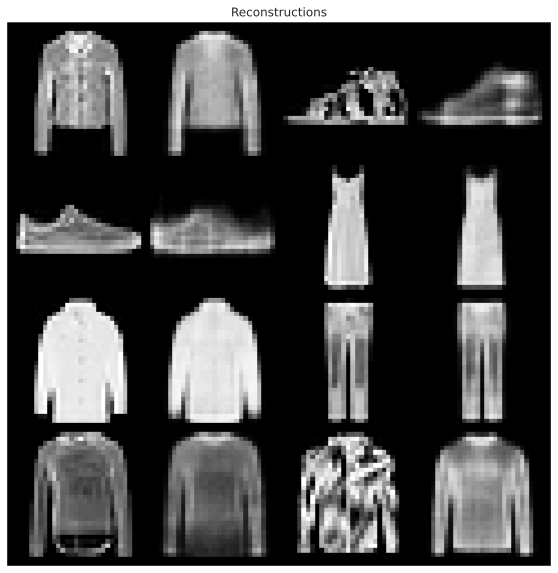

In [11]:
input_imgs = get_train_images(8)
visualize_reconstructions(vae, input_imgs, device)

In [12]:
def generate_images(model, n_imgs, device):
    # Reconstruct images
    model.eval()
    with torch.no_grad():
        generated_imgs = model.decoder(torch.randn([n_imgs, model.latent_dim]).to(device))
    generated_imgs = generated_imgs.cpu()
    
    # Plotting
#     imgs = generated_imgs.flatten(0,1)
    grid = torchvision.utils.make_grid(generated_imgs, nrow=4, normalize=False, range=(-1,1))
    grid = grid.permute(1, 2, 0)
    if len(input_imgs) == 4:
        plt.figure(figsize=(10,10))
    else:
        plt.figure(figsize=(15,10))
    plt.title(f"Generations")
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

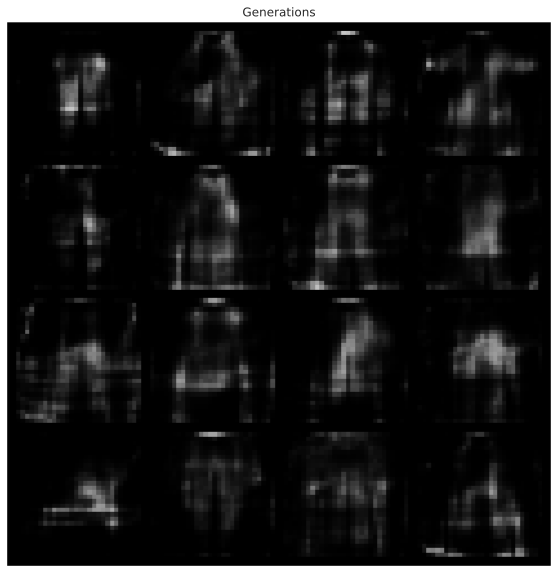

In [13]:
generate_images(vae, 16 , device)

## Co poszło nie tak?

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fa8d7fe42b0>]],
      dtype=object)

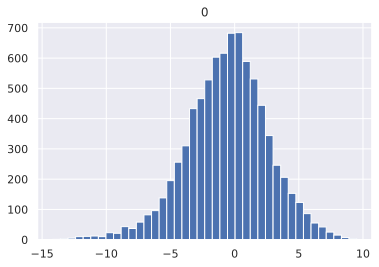

In [14]:
pd.DataFrame(means.cpu().flatten().detach().numpy()).hist(bins=40)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fa8d7948cc0>]],
      dtype=object)

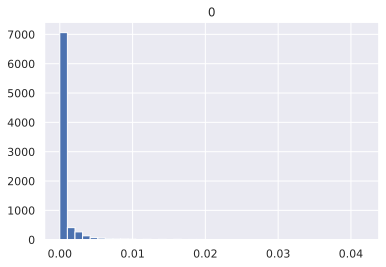

In [15]:
pd.DataFrame(torch.exp(0.5 * log_var).cpu().flatten().detach().numpy()).hist(bins=40)

### VAE Loss function

In [16]:
def vae_loss_function(x, x_hat, mean, log_var):
    reproduction_loss = nn.functional.mse_loss(x_hat, x, reduction='sum')
    KLD      = -0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())

    return reproduction_loss + KLD

In [28]:
vae = VAE(latent_dim=32, hidden_dim=256, x_dim=784).to(device)

In [29]:
optimizer = optim.Adam(vae.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=0.99)

In [30]:
num_epochs = 30
for n in range(num_epochs):
    losses_epoch = []
    for x, _ in iter(train_loader):
        x = x.to(device)
        out, means, log_var = vae(x)
        loss = vae_loss_function(x, out, means, log_var) 
        losses_epoch.append(loss.item())
        loss.backward()               # backward pass (compute parameter updates)
        optimizer.step()              # make the updates for each parameter
        optimizer.zero_grad()  
    L1_list = []
#     if n % 10 == 0:
    for x, _ in iter(test_loader):
        x  = x.to(device)
        out, _, _ = vae(x)
        L1_list.append(torch.mean(torch.abs(out-x)).item())
    print(f"Epoch {n} loss {np.mean(np.array(losses_epoch))}, test L1 = {np.mean(L1_list)}")
    scheduler.step()

Epoch 0 loss 12205.478361211271, test L1 = 0.11909906417131425
Epoch 1 loss 7741.18943225828, test L1 = 0.10055005941540003
Epoch 2 loss 7062.844860109509, test L1 = 0.09614324029535055
Epoch 3 loss 6850.738170656384, test L1 = 0.09339259713888168
Epoch 4 loss 6725.925699869792, test L1 = 0.09209466706961393
Epoch 5 loss 6636.664436014289, test L1 = 0.09102504588663578
Epoch 6 loss 6565.285033136352, test L1 = 0.08916573021560907
Epoch 7 loss 6516.539402627537, test L1 = 0.08689278624951839
Epoch 8 loss 6453.446501903045, test L1 = 0.08735611531883478
Epoch 9 loss 6421.063745743189, test L1 = 0.08714065179228783
Epoch 10 loss 6379.107590895433, test L1 = 0.08709538634866476
Epoch 11 loss 6349.185233874198, test L1 = 0.08568048942834139
Epoch 12 loss 6331.746669671475, test L1 = 0.08483484499156475
Epoch 13 loss 6300.061078976362, test L1 = 0.0840184835717082
Epoch 14 loss 6274.325166099092, test L1 = 0.08381696790456772
Epoch 15 loss 6251.512257111378, test L1 = 0.08338221628218889
Epo

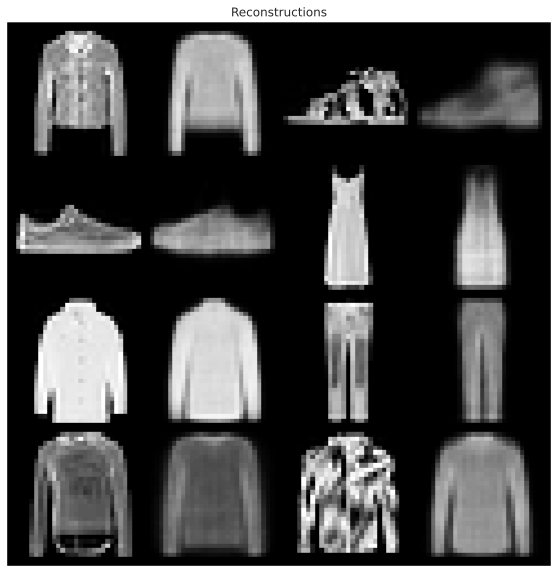

In [31]:
input_imgs = get_train_images(8)
visualize_reconstructions(vae, input_imgs, device)

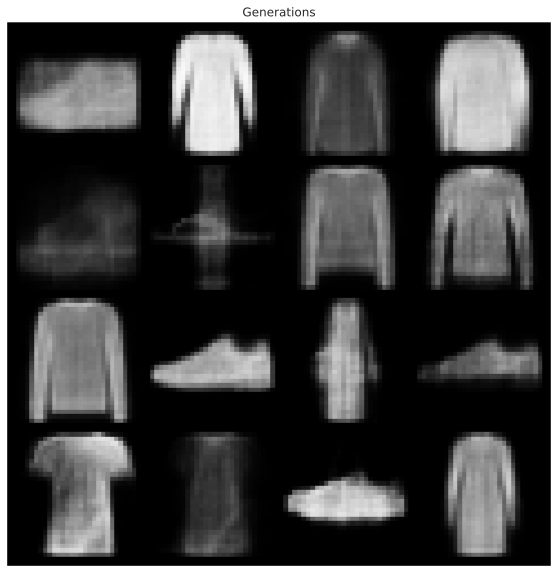

In [32]:
generate_images(vae, 16 , device)

In [33]:
import copy
vae_32 = copy.deepcopy(vae)

In [22]:
vae = VAE(latent_dim=16, hidden_dim=256, x_dim=784).to(device)

In [23]:
optimizer = optim.Adam(vae.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=0.99)

In [24]:
num_epochs = 30
for n in range(num_epochs):
    losses_epoch = []
    for x, _ in iter(train_loader):
        x = x.to(device)
        out, means, log_var = vae(x)
        loss = vae_loss_function(x, out, means, log_var) 
        losses_epoch.append(loss.item())
        loss.backward()               # backward pass (compute parameter updates)
        optimizer.step()              # make the updates for each parameter
        optimizer.zero_grad()  
    L1_list = []
#     if n % 10 == 0:
    for x, _ in iter(test_loader):
        x  = x.to(device)
        out, _, _ = vae(x)
        L1_list.append(torch.mean(torch.abs(out-x)).item())
    print(f"Epoch {n} loss {np.mean(np.array(losses_epoch))}, test L1 = {np.mean(L1_list)}")
    scheduler.step()

Epoch 0 loss 11725.141806056357, test L1 = 0.11359610836952924
Epoch 1 loss 7481.646014873798, test L1 = 0.10004993807524443
Epoch 2 loss 6997.1228757678955, test L1 = 0.09448019862174988
Epoch 3 loss 6792.438962757078, test L1 = 0.0916054243221879
Epoch 4 loss 6671.396955962874, test L1 = 0.09002418015152217
Epoch 5 loss 6573.966074886485, test L1 = 0.08881025668233633
Epoch 6 loss 6500.755247980102, test L1 = 0.08751350771635771
Epoch 7 loss 6448.430616069044, test L1 = 0.08648082036525011
Epoch 8 loss 6399.3677154280185, test L1 = 0.08736367113888263
Epoch 9 loss 6355.273118239183, test L1 = 0.08553650882095098
Epoch 10 loss 6322.547480134883, test L1 = 0.08405889924615621
Epoch 11 loss 6292.6056565504805, test L1 = 0.08334031254053116
Epoch 12 loss 6264.325368506276, test L1 = 0.08365741688758135
Epoch 13 loss 6245.824181189904, test L1 = 0.08302168119698763
Epoch 14 loss 6217.197065304487, test L1 = 0.0835380570963025
Epoch 15 loss 6200.305094401042, test L1 = 0.08242135010659694


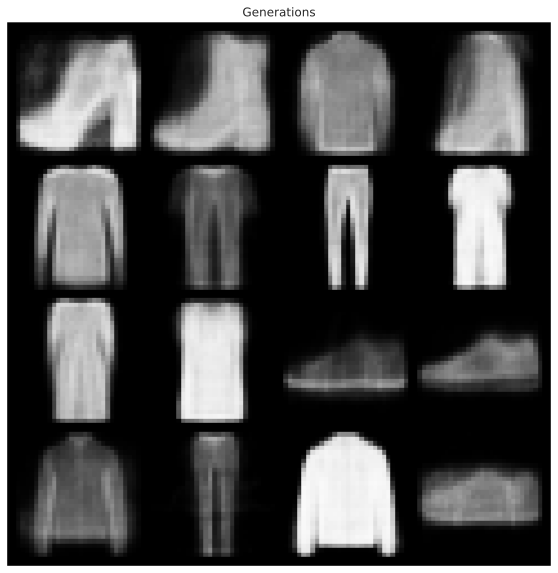

In [25]:
generate_images(vae, 16 , device)

# Przestrzeń ukryta VAE

In [34]:
def embed_imgs(model, data_loader):
    # Encode all images in the data_laoder using model, and return both images and encodings
    img_list, embed_list = [], []
    model.eval()
    labels = []
    for imgs, label in data_loader:
        with torch.no_grad():
            mean, var_log = model.encoder(imgs.to(device))
        img_list.append(imgs)
        embed_list.append(mean)
        labels.append(label)
    return (torch.cat(img_list, dim=0), torch.cat(embed_list, dim=0), torch.cat(labels, dim=0))


In [35]:
import umap
import pandas as pd
import seaborn as sns
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

/home/kdeja/bamboozle/venv/lib/python3.6/site-packages/umap/spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


In [36]:
umap_object = umap.UMAP(metric="cosine", n_neighbors=100)
train_img_embeds = embed_imgs(vae, train_loader)
test_img_embeds = embed_imgs(vae, test_loader)
train_embedded = umap_object.fit_transform(train_img_embeds[1][:5000].cpu())

/home/kdeja/bamboozle/venv/lib/python3.6/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


In [37]:
def plot_latent(train_embedded, train_img_embeds, n_data=5000):
    data = pd.DataFrame(train_embedded[:n_data])
    data["label"] = train_img_embeds[2][:n_data].cpu().numpy()
    examples = []
    examples_locations = []
    for i in np.random.randint(0,n_data,40):
        examples.append(train_img_embeds[0][i].squeeze(0).cpu().numpy())
        examples_locations.append(data.iloc[i])
    fig, ax = plt.subplots(figsize=(12, 10))
    # ax.scatter(noises_to_plot_tsne[0],noises_to_plot_tsne[1],c=noises_to_plot_tsne["batch"],s=3,alpha=0.8)
    sns.scatterplot(
        x=0, y=1,
        hue="label",
        palette=sns.color_palette("hls", 10),
        data=data,
        legend="full",
        alpha=0.1
    )
    for location, example in zip(examples_locations, examples):
        x, y = location[0], location[1]
        label = int(location["label"])
        ab = AnnotationBbox(OffsetImage(example,cmap=plt.cm.gray_r, zoom=1), (x, y), frameon=True,
                            bboxprops=dict(facecolor=sns.color_palette("hls", 10)[label], boxstyle="round"))
        ax.add_artist(ab)
    plt.show()

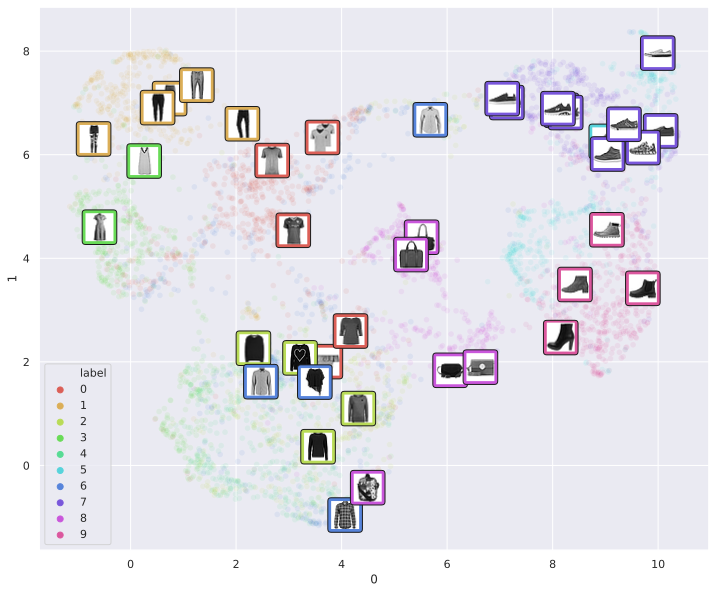

In [38]:
plot_latent(train_embedded, train_img_embeds)

In [39]:
vae = VAE(latent_dim=2, hidden_dim=256, x_dim=784).to(device)

In [40]:
optimizer = optim.Adam(vae.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=0.99)

In [41]:
num_epochs = 30
for n in range(num_epochs):
    losses_epoch = []
    for x, _ in iter(train_loader):
        x = x.to(device)
        out, means, log_var = vae(x)
        loss = vae_loss_function(x, out, means, log_var) 
        losses_epoch.append(loss.item())
        loss.backward()               # backward pass (compute parameter updates)
        optimizer.step()              # make the updates for each parameter
        optimizer.zero_grad()  
    L1_list = []
#     if n % 10 == 0:
    for x, _ in iter(test_loader):
        x  = x.to(device)
        out, _, _ = vae(x)
        L1_list.append(torch.mean(torch.abs(out-x)).item())
    print(f"Epoch {n} loss {np.mean(np.array(losses_epoch))}, test L1 = {np.mean(L1_list)}")
    scheduler.step()

Epoch 0 loss 10950.840350811299, test L1 = 0.11750308349728585
Epoch 1 loss 8235.038953993055, test L1 = 0.11239178273826837
Epoch 2 loss 7925.70848566039, test L1 = 0.11061234176158904
Epoch 3 loss 7749.99259231437, test L1 = 0.10798792131245136
Epoch 4 loss 7588.358283670539, test L1 = 0.10625391341745853
Epoch 5 loss 7469.573494674813, test L1 = 0.10530502814799547
Epoch 6 loss 7384.997706747463, test L1 = 0.10474611464887858
Epoch 7 loss 7315.5420485276445, test L1 = 0.10374141484498978
Epoch 8 loss 7276.379334017762, test L1 = 0.10266710165888071
Epoch 9 loss 7220.287209535257, test L1 = 0.1022505009546876
Epoch 10 loss 7192.2709564469815, test L1 = 0.10193357858806848
Epoch 11 loss 7176.404664129273, test L1 = 0.10294926930218935
Epoch 12 loss 7132.183447682959, test L1 = 0.1009714301675558
Epoch 13 loss 7118.622066139156, test L1 = 0.10143996570259332
Epoch 14 loss 7086.283920940171, test L1 = 0.10056149493902922
Epoch 15 loss 7072.415988498264, test L1 = 0.09987106025218964
Epo

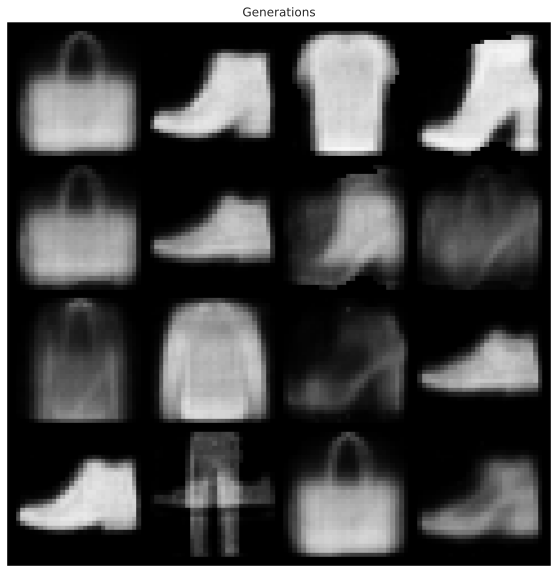

In [42]:
generate_images(vae, 16 , device)

In [43]:
train_img_embeds = embed_imgs(vae, train_loader)
test_img_embeds = embed_imgs(vae, test_loader)
train_embedded = train_img_embeds[1][:5000].cpu()

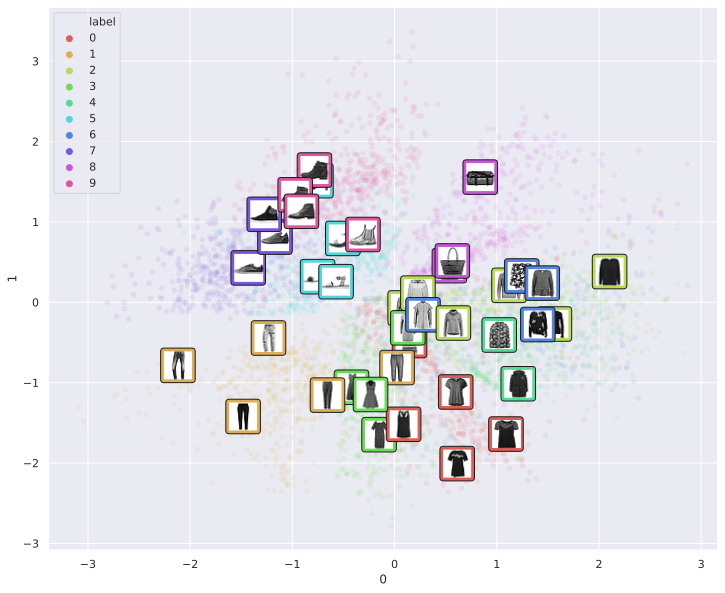

In [44]:
plot_latent(train_embedded, train_img_embeds)

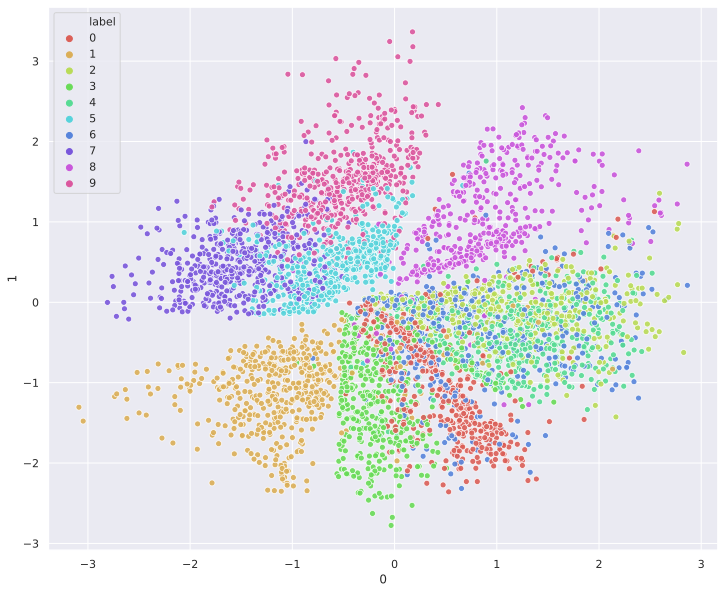

In [45]:
data = pd.DataFrame(train_embedded[:5000])
data["label"] = train_img_embeds[2][:5000].cpu().numpy()
fig, ax = plt.subplots(figsize=(12, 10))
# ax.scatter(noises_to_plot_tsne[0],noises_to_plot_tsne[1],c=noises_to_plot_tsne["batch"],s=3,alpha=0.8)
sns.scatterplot(
    x=0, y=1,
    hue="label",
    palette=sns.color_palette("hls", 10),
    data=data,
    legend="full",
    alpha=0.9
)

# Generative Adversarial Networks

In [46]:
class Discriminator(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(Discriminator, self).__init__()

        self.fc_1 = nn.Linear(input_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_out  = nn.Linear(hidden_dim, 1)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = torch.flatten(x, 1)
        x = self.LeakyReLU(self.fc_1(x))
        x = self.LeakyReLU(self.fc_2(x))
        x = self.fc_out(x)
        return x

In [47]:
class Generator(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super(Generator, self).__init__()
        self.fc_1 = nn.Linear(latent_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_3 = nn.Linear(hidden_dim, output_dim)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
    def forward(self, x):
        h     = self.LeakyReLU(self.fc_1(x))
        h     = self.LeakyReLU(self.fc_2(h))
        
        x_hat = torch.sigmoid(self.fc_3(h))
        x_hat = x_hat.view([-1, 1, 28, 28])
        return x_hat

In [48]:
# Models
latent_dim = 32
generator = Generator(latent_dim=latent_dim, hidden_dim=256, output_dim=784).to(device)
discriminator = Discriminator( hidden_dim=256, input_dim=784).to(device)

# Optimizers
generator_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0001)
generator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=generator_optimizer, gamma=0.99)
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0001)
discriminator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=discriminator_optimizer, gamma=0.99)

# loss
criterion = nn.MSELoss()

In [49]:
fixed_noise = torch.randn(16, latent_dim,device=device)

Epoch: 0, discrimiantor fake error: 0.0666, discriminator real acc: 0.822


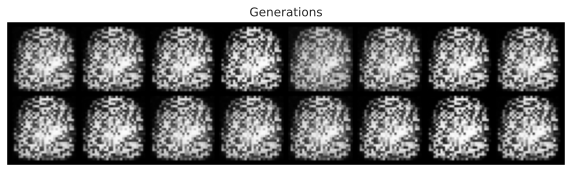

Epoch: 1, discrimiantor fake error: 0.0295, discriminator real acc: 0.939
Epoch: 2, discrimiantor fake error: 0.0181, discriminator real acc: 0.962
Epoch: 3, discrimiantor fake error: 0.00532, discriminator real acc: 0.984
Epoch: 4, discrimiantor fake error: 0.00211, discriminator real acc: 0.993
Epoch: 5, discrimiantor fake error: 0.00136, discriminator real acc: 0.997
Epoch: 6, discrimiantor fake error: 0.00166, discriminator real acc: 0.997
Epoch: 7, discrimiantor fake error: 0.00375, discriminator real acc: 0.996
Epoch: 8, discrimiantor fake error: 0.0137, discriminator real acc: 0.989
Epoch: 9, discrimiantor fake error: 0.0246, discriminator real acc: 0.978
Epoch: 10, discrimiantor fake error: 0.0127, discriminator real acc: 0.982


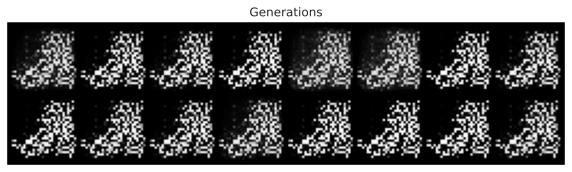

Epoch: 11, discrimiantor fake error: 0.00545, discriminator real acc: 0.991
Epoch: 12, discrimiantor fake error: 0.0049, discriminator real acc: 0.994
Epoch: 13, discrimiantor fake error: 0.0102, discriminator real acc: 0.991
Epoch: 14, discrimiantor fake error: 0.0248, discriminator real acc: 0.98
Epoch: 15, discrimiantor fake error: 0.0225, discriminator real acc: 0.977
Epoch: 16, discrimiantor fake error: 0.0108, discriminator real acc: 0.986
Epoch: 17, discrimiantor fake error: 0.00846, discriminator real acc: 0.99
Epoch: 18, discrimiantor fake error: 0.0249, discriminator real acc: 0.98
Epoch: 19, discrimiantor fake error: 0.0292, discriminator real acc: 0.973
Epoch: 20, discrimiantor fake error: 0.0197, discriminator real acc: 0.979


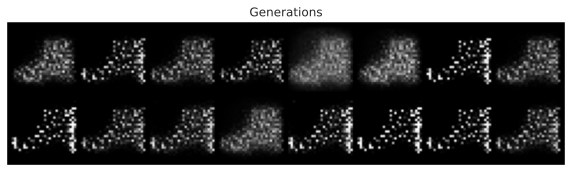

Epoch: 21, discrimiantor fake error: 0.0176, discriminator real acc: 0.983
Epoch: 22, discrimiantor fake error: 0.0215, discriminator real acc: 0.98
Epoch: 23, discrimiantor fake error: 0.0191, discriminator real acc: 0.98
Epoch: 24, discrimiantor fake error: 0.0176, discriminator real acc: 0.981
Epoch: 25, discrimiantor fake error: 0.0182, discriminator real acc: 0.98
Epoch: 26, discrimiantor fake error: 0.0192, discriminator real acc: 0.98
Epoch: 27, discrimiantor fake error: 0.0148, discriminator real acc: 0.984
Epoch: 28, discrimiantor fake error: 0.0151, discriminator real acc: 0.986
Epoch: 29, discrimiantor fake error: 0.0152, discriminator real acc: 0.985
Epoch: 30, discrimiantor fake error: 0.0186, discriminator real acc: 0.983


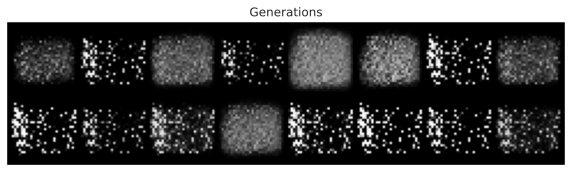

Epoch: 31, discrimiantor fake error: 0.0222, discriminator real acc: 0.979
Epoch: 32, discrimiantor fake error: 0.0208, discriminator real acc: 0.979
Epoch: 33, discrimiantor fake error: 0.0191, discriminator real acc: 0.981
Epoch: 34, discrimiantor fake error: 0.0202, discriminator real acc: 0.981
Epoch: 35, discrimiantor fake error: 0.0186, discriminator real acc: 0.981
Epoch: 36, discrimiantor fake error: 0.023, discriminator real acc: 0.977
Epoch: 37, discrimiantor fake error: 0.03, discriminator real acc: 0.974
Epoch: 38, discrimiantor fake error: 0.0317, discriminator real acc: 0.969
Epoch: 39, discrimiantor fake error: 0.0306, discriminator real acc: 0.966
Epoch: 40, discrimiantor fake error: 0.0325, discriminator real acc: 0.97


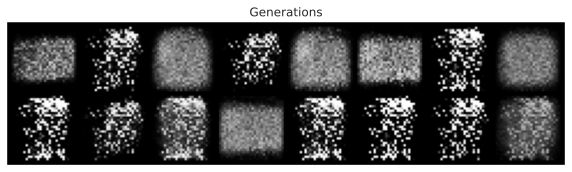

Epoch: 41, discrimiantor fake error: 0.0357, discriminator real acc: 0.964
Epoch: 42, discrimiantor fake error: 0.0349, discriminator real acc: 0.964
Epoch: 43, discrimiantor fake error: 0.0341, discriminator real acc: 0.966
Epoch: 44, discrimiantor fake error: 0.0363, discriminator real acc: 0.964
Epoch: 45, discrimiantor fake error: 0.0354, discriminator real acc: 0.963
Epoch: 46, discrimiantor fake error: 0.0421, discriminator real acc: 0.96
Epoch: 47, discrimiantor fake error: 0.0445, discriminator real acc: 0.957
Epoch: 48, discrimiantor fake error: 0.0461, discriminator real acc: 0.953
Epoch: 49, discrimiantor fake error: 0.0447, discriminator real acc: 0.956
Epoch: 50, discrimiantor fake error: 0.0427, discriminator real acc: 0.96


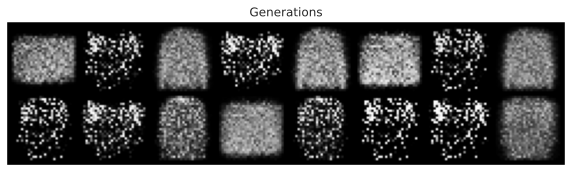

Epoch: 51, discrimiantor fake error: 0.0401, discriminator real acc: 0.96
Epoch: 52, discrimiantor fake error: 0.0418, discriminator real acc: 0.956
Epoch: 53, discrimiantor fake error: 0.0442, discriminator real acc: 0.956
Epoch: 54, discrimiantor fake error: 0.0445, discriminator real acc: 0.959
Epoch: 55, discrimiantor fake error: 0.0454, discriminator real acc: 0.957
Epoch: 56, discrimiantor fake error: 0.0463, discriminator real acc: 0.951
Epoch: 57, discrimiantor fake error: 0.052, discriminator real acc: 0.95
Epoch: 58, discrimiantor fake error: 0.054, discriminator real acc: 0.95
Epoch: 59, discrimiantor fake error: 0.0497, discriminator real acc: 0.95
Epoch: 60, discrimiantor fake error: 0.0533, discriminator real acc: 0.947


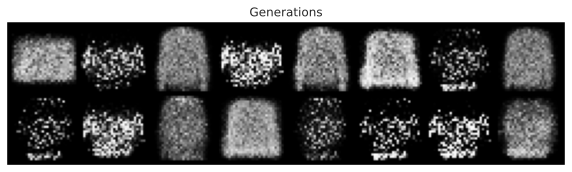

Epoch: 61, discrimiantor fake error: 0.0625, discriminator real acc: 0.94
Epoch: 62, discrimiantor fake error: 0.0695, discriminator real acc: 0.931
Epoch: 63, discrimiantor fake error: 0.0686, discriminator real acc: 0.933
Epoch: 64, discrimiantor fake error: 0.0668, discriminator real acc: 0.936
Epoch: 65, discrimiantor fake error: 0.0657, discriminator real acc: 0.935
Epoch: 66, discrimiantor fake error: 0.069, discriminator real acc: 0.931
Epoch: 67, discrimiantor fake error: 0.0712, discriminator real acc: 0.927
Epoch: 68, discrimiantor fake error: 0.0844, discriminator real acc: 0.914
Epoch: 69, discrimiantor fake error: 0.083, discriminator real acc: 0.922
Epoch: 70, discrimiantor fake error: 0.084, discriminator real acc: 0.921


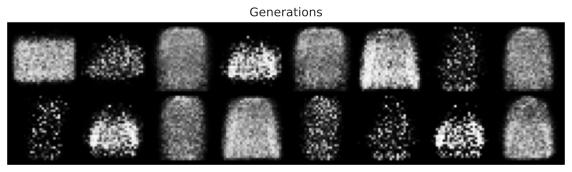

Epoch: 71, discrimiantor fake error: 0.077, discriminator real acc: 0.921
Epoch: 72, discrimiantor fake error: 0.0753, discriminator real acc: 0.924
Epoch: 73, discrimiantor fake error: 0.0837, discriminator real acc: 0.915
Epoch: 74, discrimiantor fake error: 0.0826, discriminator real acc: 0.92
Epoch: 75, discrimiantor fake error: 0.079, discriminator real acc: 0.918
Epoch: 76, discrimiantor fake error: 0.0873, discriminator real acc: 0.912
Epoch: 77, discrimiantor fake error: 0.0931, discriminator real acc: 0.91
Epoch: 78, discrimiantor fake error: 0.0962, discriminator real acc: 0.904
Epoch: 79, discrimiantor fake error: 0.0892, discriminator real acc: 0.909
Epoch: 80, discrimiantor fake error: 0.0938, discriminator real acc: 0.908


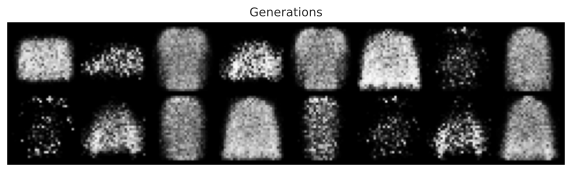

Epoch: 81, discrimiantor fake error: 0.0935, discriminator real acc: 0.906
Epoch: 82, discrimiantor fake error: 0.104, discriminator real acc: 0.905
Epoch: 83, discrimiantor fake error: 0.107, discriminator real acc: 0.891
Epoch: 84, discrimiantor fake error: 0.105, discriminator real acc: 0.896
Epoch: 85, discrimiantor fake error: 0.103, discriminator real acc: 0.9
Epoch: 86, discrimiantor fake error: 0.0993, discriminator real acc: 0.897
Epoch: 87, discrimiantor fake error: 0.101, discriminator real acc: 0.895
Epoch: 88, discrimiantor fake error: 0.115, discriminator real acc: 0.887
Epoch: 89, discrimiantor fake error: 0.118, discriminator real acc: 0.882
Epoch: 90, discrimiantor fake error: 0.117, discriminator real acc: 0.88


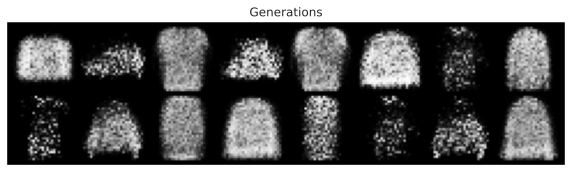

Epoch: 91, discrimiantor fake error: 0.114, discriminator real acc: 0.89
Epoch: 92, discrimiantor fake error: 0.118, discriminator real acc: 0.884
Epoch: 93, discrimiantor fake error: 0.121, discriminator real acc: 0.883
Epoch: 94, discrimiantor fake error: 0.117, discriminator real acc: 0.887
Epoch: 95, discrimiantor fake error: 0.122, discriminator real acc: 0.879
Epoch: 96, discrimiantor fake error: 0.116, discriminator real acc: 0.887
Epoch: 97, discrimiantor fake error: 0.116, discriminator real acc: 0.886
Epoch: 98, discrimiantor fake error: 0.123, discriminator real acc: 0.88
Epoch: 99, discrimiantor fake error: 0.125, discriminator real acc: 0.879


In [50]:
G_losses = []
D_losses = []
num_epochs = 100
for epoch in range(num_epochs):
    # For each batch in the dataloader
    discriminator_fake_acc = []
    discriminator_real_acc = []
    for i, data in enumerate(train_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        discriminator_optimizer.zero_grad()
        # Format batch
        real_images = data[0].to(device)
        b_size = real_images.size(0)
        label = torch.ones((b_size,), dtype=torch.float, device=device) # Setting labels for real images
        # Forward pass real batch through D
        output = discriminator(real_images).view(-1)
        # Calculate loss on all-real batch
        error_discriminator_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        error_discriminator_real.backward()
        discriminator_real_acc.append(output.mean().item())

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, latent_dim,device=device)
        # Generate fake image batch with Generator
        fake_images = generator(noise)
        label_fake = torch.zeros((b_size,), dtype=torch.float, device=device)
        # Classify all fake batch with Discriminator
        output = discriminator(fake_images.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        error_discriminator_fake = criterion(output, label_fake)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        error_discriminator_fake.backward()
        discriminator_fake_acc.append(output.mean().item())
        # Compute error of D as sum over the fake and the real batches
        error_discriminator = error_discriminator_real + error_discriminator_fake
        # Update D
        discriminator_optimizer.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        generator_optimizer.zero_grad()
        label = torch.ones((b_size,), dtype=torch.float, device=device)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = discriminator(fake_images).view(-1)
        # Calculate G's loss based on this output
        error_generator = criterion(output, label)
        # Calculate gradients for G
        error_generator.backward()
        D_G_z2 = output.mean().item()
        # Update G
        generator_optimizer.step()

        # Output training stats
        # Save Losses for plotting later
        G_losses.append(error_generator.item())
        D_losses.append(error_discriminator.item())

    print(f"Epoch: {epoch}, discrimiantor fake error: {np.mean(discriminator_fake_acc):.3}, discriminator real acc: {np.mean(discriminator_real_acc):.3}")
    generator_scheduler.step()
    discriminator_scheduler.step()
    if epoch % 10 == 0:
        with torch.no_grad():
            fake = generator(fixed_noise).detach().cpu()
        grid = torchvision.utils.make_grid(fake)
        grid = grid.permute(1, 2, 0)
        plt.figure(figsize=(10,10))
        plt.title(f"Generations")
        plt.imshow(grid)
        plt.axis('off')
        plt.show()

In [51]:
class Cond_Discriminator(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(Cond_Discriminator, self).__init__()

        self.fc_1 = nn.Linear(input_dim + 10, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_out  = nn.Linear(hidden_dim, 1)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)

    def forward(self, x, y):
        x = torch.flatten(x, 1)
        x = torch.cat([x,y], 1)
        x = self.LeakyReLU(self.fc_1(x))
        x = self.LeakyReLU(self.fc_2(x))
        x = self.fc_out(x)
        return x

In [52]:
class Cond_Generator(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super(Cond_Generator, self).__init__()
        self.fc_1 = nn.Linear(latent_dim+10, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_3 = nn.Linear(hidden_dim, output_dim)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
    def forward(self, x,y):
        x = torch.cat([x,y], 1)
        h     = self.LeakyReLU(self.fc_1(x))
        h     = self.LeakyReLU(self.fc_2(h))
        x_hat = torch.sigmoid(self.fc_3(h))
        x_hat = x_hat.view([-1, 1, 28, 28])
        return x_hat

In [53]:
# Models
latent_dim = 32
cond_generator = Cond_Generator(latent_dim=latent_dim, hidden_dim=256, output_dim=784).to(device)
cond_discriminator = Cond_Discriminator( hidden_dim=256, input_dim=784).to(device)

# Optimizers
generator_optimizer = torch.optim.Adam(cond_generator.parameters(), lr=0.0001)
generator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=generator_optimizer, gamma=0.99)
discriminator_optimizer = torch.optim.Adam(cond_discriminator.parameters(), lr=0.0001)
discriminator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=discriminator_optimizer, gamma=0.99)

# loss
criterion = nn.MSELoss()

In [54]:
fixed_noise = torch.randn(16, latent_dim,device=device)
fixed_labels = torch.randint(10,(16,),device=device)
fixed_labels = F.one_hot(fixed_labels, 10).float()

Epoch: 0, discrimiantor fake error: 0.0638, discriminator real acc: 0.839


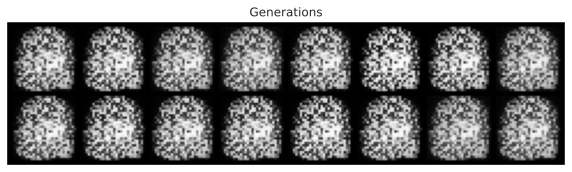

Epoch: 1, discrimiantor fake error: 0.0369, discriminator real acc: 0.946
Epoch: 2, discrimiantor fake error: 0.0268, discriminator real acc: 0.957
Epoch: 3, discrimiantor fake error: 0.00515, discriminator real acc: 0.983
Epoch: 4, discrimiantor fake error: 0.00161, discriminator real acc: 0.994
Epoch: 5, discrimiantor fake error: 0.00123, discriminator real acc: 0.996
Epoch: 6, discrimiantor fake error: 0.00154, discriminator real acc: 0.997
Epoch: 7, discrimiantor fake error: 0.0022, discriminator real acc: 0.998
Epoch: 8, discrimiantor fake error: 0.00568, discriminator real acc: 0.995
Epoch: 9, discrimiantor fake error: 0.0223, discriminator real acc: 0.982
Epoch: 10, discrimiantor fake error: 0.0232, discriminator real acc: 0.977


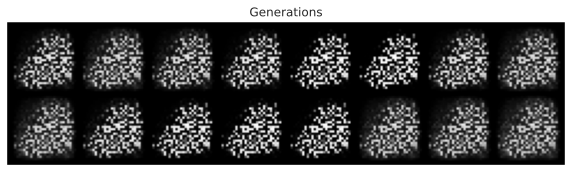

Epoch: 11, discrimiantor fake error: 0.0125, discriminator real acc: 0.985
Epoch: 12, discrimiantor fake error: 0.00471, discriminator real acc: 0.993
Epoch: 13, discrimiantor fake error: 0.00611, discriminator real acc: 0.994
Epoch: 14, discrimiantor fake error: 0.0394, discriminator real acc: 0.974
Epoch: 15, discrimiantor fake error: 0.0314, discriminator real acc: 0.963
Epoch: 16, discrimiantor fake error: 0.0122, discriminator real acc: 0.985
Epoch: 17, discrimiantor fake error: 0.0121, discriminator real acc: 0.988
Epoch: 18, discrimiantor fake error: 0.0299, discriminator real acc: 0.975
Epoch: 19, discrimiantor fake error: 0.0254, discriminator real acc: 0.974
Epoch: 20, discrimiantor fake error: 0.0143, discriminator real acc: 0.986


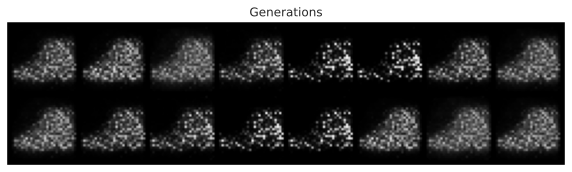

Epoch: 21, discrimiantor fake error: 0.0173, discriminator real acc: 0.983
Epoch: 22, discrimiantor fake error: 0.0233, discriminator real acc: 0.978
Epoch: 23, discrimiantor fake error: 0.0183, discriminator real acc: 0.981
Epoch: 24, discrimiantor fake error: 0.0152, discriminator real acc: 0.984
Epoch: 25, discrimiantor fake error: 0.0132, discriminator real acc: 0.986
Epoch: 26, discrimiantor fake error: 0.0167, discriminator real acc: 0.984
Epoch: 27, discrimiantor fake error: 0.0183, discriminator real acc: 0.982
Epoch: 28, discrimiantor fake error: 0.0188, discriminator real acc: 0.983
Epoch: 29, discrimiantor fake error: 0.0194, discriminator real acc: 0.98
Epoch: 30, discrimiantor fake error: 0.0308, discriminator real acc: 0.971


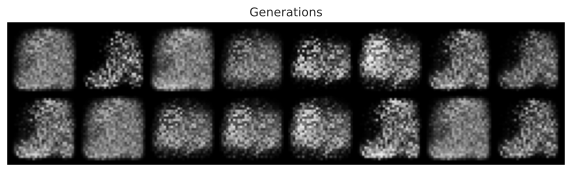

Epoch: 31, discrimiantor fake error: 0.0391, discriminator real acc: 0.964
Epoch: 32, discrimiantor fake error: 0.0418, discriminator real acc: 0.96
Epoch: 33, discrimiantor fake error: 0.0482, discriminator real acc: 0.956
Epoch: 34, discrimiantor fake error: 0.0403, discriminator real acc: 0.962
Epoch: 35, discrimiantor fake error: 0.0433, discriminator real acc: 0.959
Epoch: 36, discrimiantor fake error: 0.0436, discriminator real acc: 0.955
Epoch: 37, discrimiantor fake error: 0.0468, discriminator real acc: 0.957
Epoch: 38, discrimiantor fake error: 0.0475, discriminator real acc: 0.953
Epoch: 39, discrimiantor fake error: 0.0547, discriminator real acc: 0.95
Epoch: 40, discrimiantor fake error: 0.0544, discriminator real acc: 0.946


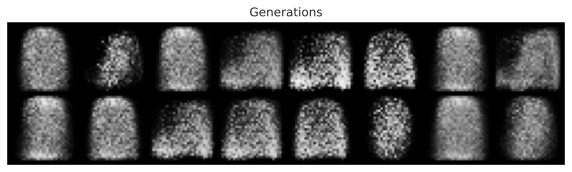

Epoch: 41, discrimiantor fake error: 0.0582, discriminator real acc: 0.947
Epoch: 42, discrimiantor fake error: 0.056, discriminator real acc: 0.948
Epoch: 43, discrimiantor fake error: 0.0628, discriminator real acc: 0.94
Epoch: 44, discrimiantor fake error: 0.0663, discriminator real acc: 0.938
Epoch: 45, discrimiantor fake error: 0.0644, discriminator real acc: 0.942
Epoch: 46, discrimiantor fake error: 0.0679, discriminator real acc: 0.936
Epoch: 47, discrimiantor fake error: 0.0629, discriminator real acc: 0.936
Epoch: 48, discrimiantor fake error: 0.0596, discriminator real acc: 0.945
Epoch: 49, discrimiantor fake error: 0.0665, discriminator real acc: 0.936
Epoch: 50, discrimiantor fake error: 0.0695, discriminator real acc: 0.935


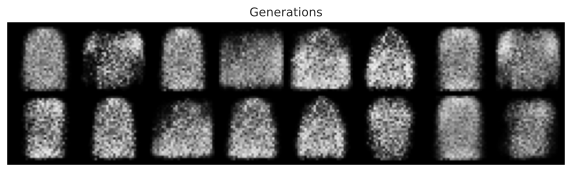

Epoch: 51, discrimiantor fake error: 0.0712, discriminator real acc: 0.934
Epoch: 52, discrimiantor fake error: 0.067, discriminator real acc: 0.934
Epoch: 53, discrimiantor fake error: 0.071, discriminator real acc: 0.933
Epoch: 54, discrimiantor fake error: 0.073, discriminator real acc: 0.93
Epoch: 55, discrimiantor fake error: 0.0706, discriminator real acc: 0.933
Epoch: 56, discrimiantor fake error: 0.0721, discriminator real acc: 0.928
Epoch: 57, discrimiantor fake error: 0.0705, discriminator real acc: 0.93
Epoch: 58, discrimiantor fake error: 0.0779, discriminator real acc: 0.928
Epoch: 59, discrimiantor fake error: 0.0817, discriminator real acc: 0.919
Epoch: 60, discrimiantor fake error: 0.0836, discriminator real acc: 0.917


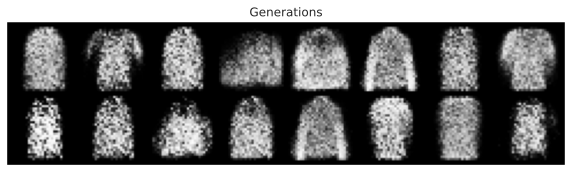

Epoch: 61, discrimiantor fake error: 0.0844, discriminator real acc: 0.919
Epoch: 62, discrimiantor fake error: 0.0896, discriminator real acc: 0.91
Epoch: 63, discrimiantor fake error: 0.0966, discriminator real acc: 0.906
Epoch: 64, discrimiantor fake error: 0.101, discriminator real acc: 0.902
Epoch: 65, discrimiantor fake error: 0.0916, discriminator real acc: 0.907
Epoch: 66, discrimiantor fake error: 0.094, discriminator real acc: 0.912
Epoch: 67, discrimiantor fake error: 0.0988, discriminator real acc: 0.899
Epoch: 68, discrimiantor fake error: 0.104, discriminator real acc: 0.898
Epoch: 69, discrimiantor fake error: 0.0989, discriminator real acc: 0.905
Epoch: 70, discrimiantor fake error: 0.103, discriminator real acc: 0.898


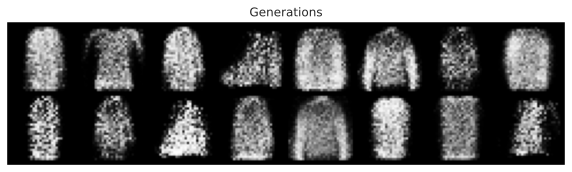

Epoch: 71, discrimiantor fake error: 0.101, discriminator real acc: 0.897
Epoch: 72, discrimiantor fake error: 0.108, discriminator real acc: 0.896
Epoch: 73, discrimiantor fake error: 0.116, discriminator real acc: 0.887
Epoch: 74, discrimiantor fake error: 0.112, discriminator real acc: 0.884
Epoch: 75, discrimiantor fake error: 0.115, discriminator real acc: 0.886
Epoch: 76, discrimiantor fake error: 0.12, discriminator real acc: 0.877
Epoch: 77, discrimiantor fake error: 0.11, discriminator real acc: 0.887
Epoch: 78, discrimiantor fake error: 0.115, discriminator real acc: 0.886
Epoch: 79, discrimiantor fake error: 0.121, discriminator real acc: 0.877
Epoch: 80, discrimiantor fake error: 0.125, discriminator real acc: 0.874


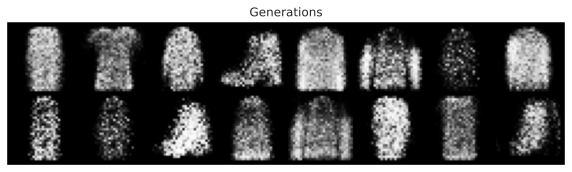

Epoch: 81, discrimiantor fake error: 0.12, discriminator real acc: 0.88
Epoch: 82, discrimiantor fake error: 0.121, discriminator real acc: 0.881
Epoch: 83, discrimiantor fake error: 0.122, discriminator real acc: 0.877
Epoch: 84, discrimiantor fake error: 0.126, discriminator real acc: 0.872
Epoch: 85, discrimiantor fake error: 0.126, discriminator real acc: 0.873
Epoch: 86, discrimiantor fake error: 0.136, discriminator real acc: 0.865
Epoch: 87, discrimiantor fake error: 0.139, discriminator real acc: 0.861
Epoch: 88, discrimiantor fake error: 0.134, discriminator real acc: 0.865
Epoch: 89, discrimiantor fake error: 0.148, discriminator real acc: 0.852
Epoch: 90, discrimiantor fake error: 0.137, discriminator real acc: 0.864


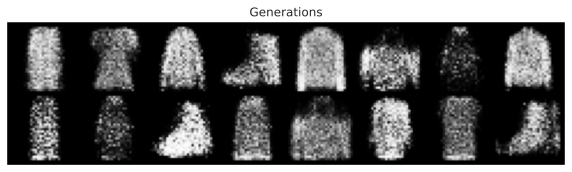

Epoch: 91, discrimiantor fake error: 0.146, discriminator real acc: 0.853
Epoch: 92, discrimiantor fake error: 0.137, discriminator real acc: 0.863
Epoch: 93, discrimiantor fake error: 0.143, discriminator real acc: 0.855
Epoch: 94, discrimiantor fake error: 0.138, discriminator real acc: 0.859
Epoch: 95, discrimiantor fake error: 0.139, discriminator real acc: 0.86
Epoch: 96, discrimiantor fake error: 0.141, discriminator real acc: 0.86
Epoch: 97, discrimiantor fake error: 0.145, discriminator real acc: 0.854
Epoch: 98, discrimiantor fake error: 0.139, discriminator real acc: 0.862
Epoch: 99, discrimiantor fake error: 0.142, discriminator real acc: 0.86
Epoch: 100, discrimiantor fake error: 0.143, discriminator real acc: 0.852


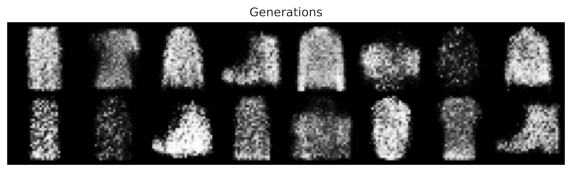

In [55]:
G_losses = []
D_losses = []
num_epochs = 101
for epoch in range(num_epochs):
    # For each batch in the dataloader
    discriminator_fake_acc = []
    discriminator_real_acc = []
    for i, data in enumerate(train_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        discriminator_optimizer.zero_grad()
        # Format batch
        real_images = data[0].to(device)
        y = data[1]
        y = F.one_hot(y).to(device).float()
        b_size = real_images.size(0)
        label = torch.ones((b_size,), dtype=torch.float, device=device) # Setting labels for real images
        # Forward pass real batch through D
        output = cond_discriminator(real_images, y).view(-1)
        # Calculate loss on all-real batch
        error_discriminator_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        error_discriminator_real.backward()
        discriminator_real_acc.append(output.mean().item())

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, latent_dim,device=device)
        rand_y = torch.randint(10,(b_size,),device=device)
        rand_y = F.one_hot(rand_y, 10).float()
        # Generate fake image batch with Generator
        fake_images = cond_generator(noise, rand_y)
        label_fake = torch.zeros((b_size,), dtype=torch.float, device=device)
        # Classify all fake batch with Discriminator
        output = cond_discriminator(fake_images.detach(), rand_y).view(-1)
        # Calculate D's loss on the all-fake batch
        error_discriminator_fake = criterion(output, label_fake)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        error_discriminator_fake.backward()
        discriminator_fake_acc.append(output.mean().item())
        # Compute error of D as sum over the fake and the real batches
        error_discriminator = error_discriminator_real + error_discriminator_fake
        # Update D
        discriminator_optimizer.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
#         for _ in range(3):
        noise = torch.randn(b_size, latent_dim,device=device)
        rand_y = torch.randint(10,(b_size,),device=device)
        rand_y = F.one_hot(rand_y, 10).float()
        fake_images = cond_generator(noise, rand_y)
        generator_optimizer.zero_grad()
        label = torch.ones((b_size,), dtype=torch.float, device=device)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = cond_discriminator(fake_images, rand_y).view(-1)
        # Calculate G's loss based on this output
        error_generator = criterion(output, label)
        # Calculate gradients for G
        error_generator.backward()
        D_G_z2 = output.mean().item()
        # Update G
        generator_optimizer.step()

        # Output training stats
        # Save Losses for plotting later
        G_losses.append(error_generator.item())
        D_losses.append(error_discriminator.item())

    print(f"Epoch: {epoch}, discrimiantor fake error: {np.mean(discriminator_fake_acc):.3}, discriminator real acc: {np.mean(discriminator_real_acc):.3}")
    generator_scheduler.step()
    discriminator_scheduler.step()
    if epoch % 10 == 0:
        with torch.no_grad():
            fake = cond_generator(fixed_noise, fixed_labels).detach().cpu()
        grid = torchvision.utils.make_grid(fake)
        grid = grid.permute(1, 2, 0)
        plt.figure(figsize=(10,10))
        plt.title(f"Generations")
        plt.imshow(grid)
        plt.axis('off')
        plt.show()

# Ewaluacja modeli generatywnych

In [56]:
class Evaluator(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(Evaluator, self).__init__()

        self.fc_1 = nn.Linear(input_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, 50)
        self.fc_out  = nn.Linear(50, 10)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
    def get_features(self, x):
        x = torch.flatten(x, 1)
        x = self.LeakyReLU(self.fc_1(x))
        x = self.LeakyReLU(self.fc_2(x))
        return x
    

    def forward(self, x):
        x = self.get_features(x)
        x = self.fc_out(x)
        return x

evaluator = Evaluator(28*28, 256).to(device)

In [57]:
# Optimizers
optimizer = torch.optim.Adam(evaluator.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=0.97)

# loss
criterion = nn.CrossEntropyLoss()

In [58]:
num_epochs = 7
for epoch in range(num_epochs):
    for data, targets in iter(train_loader):
        data = data.to(device)
        targets = targets.to(device)

        results = evaluator(data)
        loss = criterion(results, targets)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

In [59]:
num_correct = 0
total_guesses = 0

evaluator.eval()
with torch.no_grad():
    for data, targets in iter(test_loader):
        # Sends data and targets to device
        data = data.to(device)
        targets = targets.to(device)

        # Acquires the network's best guesses at each class
        results = evaluator(data)
        best_guesses = torch.argmax(results, 1)

        # Updates number of correct and total guesses
        num_correct += torch.eq(targets, best_guesses).sum().item()
        total_guesses += len(targets)

print("Correctly guessed ", num_correct/total_guesses*100, "% of the dataset")

Correctly guessed  87.06 % of the dataset


In [ ]:
# torch.save(generator.state_dict(),"lab_9/generator")
# torch.save(vae.state_dict(),"lab_9/vae")
# torch.save(cond_generator.state_dict(),"lab_9/cond_generator")

In [61]:
vae = vae_32

In [62]:
with torch.no_grad():
    fixed_noise = torch.randn(1000, latent_dim,device=device)
    fixed_labels = torch.randint(10,(1000,),device=device)
    fixed_labels = F.one_hot(fixed_labels, 10).float()
    generations_cond_gan = cond_generator(fixed_noise, fixed_labels)
    generations_gan = generator(fixed_noise)
    generations_vae = vae.decoder(fixed_noise)

In [63]:
orig_data = [x[0] for x in list(test_set)[:1000]]
orig_data = torch.cat(orig_data)

In [64]:
with torch.no_grad():
    dist_orig_data = evaluator.get_features(orig_data.to(device)).cpu()
    dist_vae = evaluator.get_features(generations_vae.to(device)).cpu()
    dist_gan = evaluator.get_features(generations_gan.to(device)).cpu()
    dist_cond_gan = evaluator.get_features(generations_cond_gan.to(device)).cpu()

/home/kdeja/bamboozle/venv/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


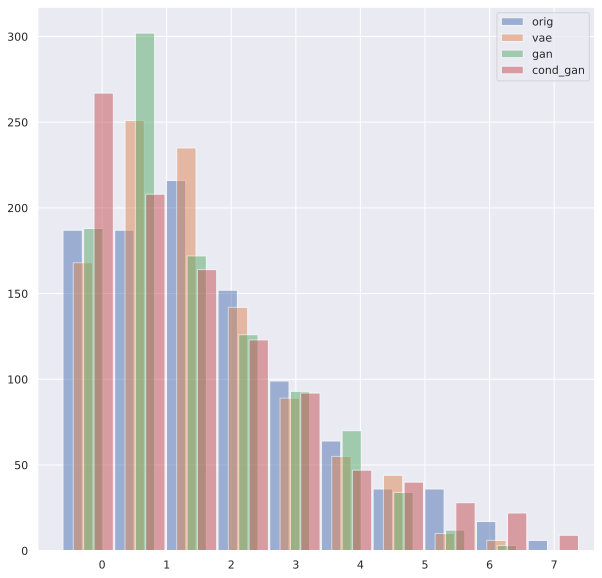

/home/kdeja/bamboozle/venv/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


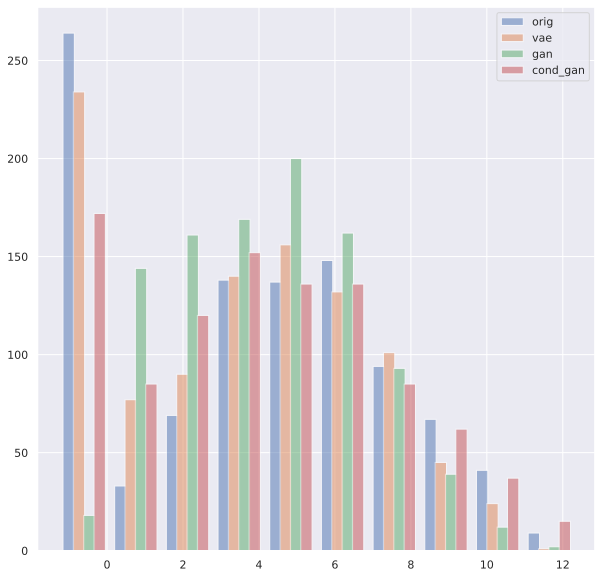

/home/kdeja/bamboozle/venv/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


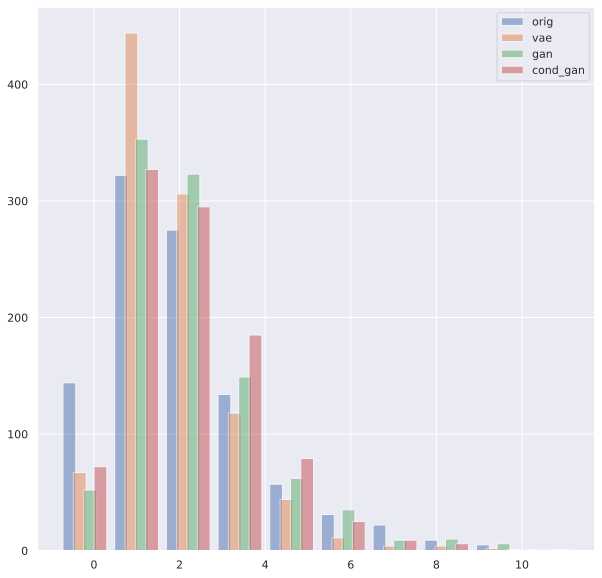

/home/kdeja/bamboozle/venv/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


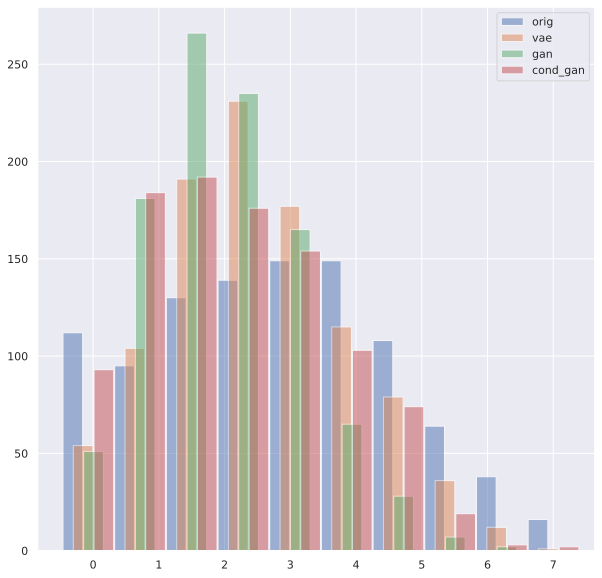

/home/kdeja/bamboozle/venv/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


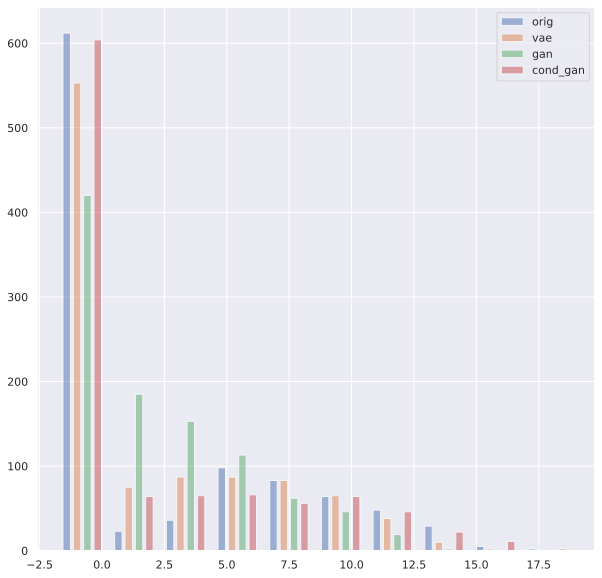

In [68]:
for idx in range(5):
    bins = 10
    w = 0.3
    plt.figure(figsize=(10,10))
    plt.hist([dist_orig_data[:,idx].numpy(),dist_vae[:,idx].numpy(),dist_gan[:,idx], dist_cond_gan[:,idx]], bins, alpha=0.5, label=['orig','vae','gan','cond_gan'],width=w)
    plt.legend(loc='upper right')
    plt.show();
    plt.close()

In [69]:
######### Frechet Inception distance based on implementation from https://github.com/mseitzer/pytorch-fid

import numpy as np
from scipy import linalg


def calculate_frechet_distance(distribution_1, distribution_2, eps=1e-6):
    mu1 = np.mean(distribution_1, axis=0)
    sigma1 = np.cov(distribution_1, rowvar=False)

    mu2 = np.mean(distribution_2, axis=0)
    sigma2 = np.cov(distribution_2, rowvar=False)

    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    Stable version by Dougal J. Sutherland.
    Params:
    -- mu1   : Numpy array containing the activations of a layer of the
               inception net (like returned by the function 'get_predictions')
               for generated samples.
    -- mu2   : The sample mean over activations, precalculated on an
               representative data set.
    -- sigma1: The covariance matrix over activations for generated samples.
    -- sigma2: The covariance matrix over activations, precalculated on an
               representative data set.
    Returns:
    --   : The Frechet Distance.
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    # Product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    # Numerical error might give slight imaginary component
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)

In [70]:
orig_data_2 = [x[0] for x in list(test_set)[-1000:]]
orig_data_2 = torch.cat(orig_data_2)
with torch.no_grad():
    dist_orig_data_2 = evaluator.get_features(orig_data_2.to(device)).cpu()

In [71]:
for name, obj in zip(['orig','vae','gan','cond_gan'],[dist_orig_data_2.numpy(),dist_vae.numpy(),dist_gan.numpy(), dist_cond_gan.numpy()]):
    print(f"FD {name}: {calculate_frechet_distance(dist_orig_data.numpy(),obj)}")

FD orig: 1.86228652528996
FD vae: 14.158209689798184
FD gan: 92.7576155027362
FD cond_gan: 30.48216129378767
